# Customer Segmentation

# **Case Study: Analyzing Customer Churn for an Internet Service Provider: Identifying Key Drivers and Retention Strategies**

-----
## **Context:**
-----

Context of the Company
The company is an Internet Service Provider (ISP) that offers a variety of services, including phone, internet (DSL or Fiber Optic), online security, device protection, technical support, and streaming services. It has a diverse customer base with varying contract lengths, payment methods, and preferences for additional services. The ISP operates in a highly competitive market where retaining customers is as important as acquiring new ones.

Business Objective
The company aims to identify factors that contribute to customer churn and proactively address issues to reduce it. Churn (customers discontinuing their service) directly impacts revenue, customer acquisition costs, and overall market competitiveness.

By analyzing this dataset, the company can:

Profile Customers at Risk of Churn: Determine which customer segments (based on demographics, usage, and billing patterns) are more likely to leave.
Understand Churn Drivers: Identify service features or gaps (e.g., technical support quality, pricing, or billing issues) that correlate with customer dissatisfaction and churn.
Develop Retention Strategies: Use insights to create targeted interventions, such as offering discounts, improving service quality, or providing personalized recommendations to reduce churn.
Improve Overall Customer Experience: Analyze feedback loops and improve product offerings, contracts, and support systems.
Key Evaluation Goals Using the Dataset
The company will likely use this dataset to evaluate customer churn through the following approaches:

1. Feature Analysis
Demographics: Age groups (SeniorCitizen), gender, and family status (Partner, Dependents) might provide insights into groups more prone to churn.
Service Usage: Analyze whether customers using specific services (InternetService, StreamingTV, DeviceProtection) are more likely to churn.
Tenure and Loyalty: Determine if newer customers (low tenure) are more likely to churn compared to long-term customers.
Billing and Payments: Assess the impact of payment methods (Electronic check, Mailed check) and billing preferences (PaperlessBilling) on churn. Investigate if higher MonthlyCharges or TotalCharges contribute to churn.
Contract Type: Evaluate whether customers on Month-to-month contracts are more likely to churn compared to those with longer-term contracts.
2. Behavioral Patterns
Customers with inconsistent usage or those who do not use add-ons like OnlineBackup, TechSupport, or StreamingMovies may show signs of disengagement.
Customers with No PhoneService or limited use of multiple lines may have lower overall engagement.
3. Churn Prediction
Use machine learning models to predict churn based on attributes like tenure, service usage, billing preferences, and demographics. This prediction allows for identifying at-risk customers proactively.
Example models include Logistic Regression, Decision Trees, or Gradient Boosted Trees.
4. Customer Segmentation
Group customers based on shared characteristics (e.g., high spenders vs. low spenders, long-term vs. short-term contracts) to identify high-risk segments.
5. Intervention Planning
Develop strategies tailored to customer needs. For instance:
Offer discounts or incentives for customers with high churn likelihood.
Recommend higher-tier contracts to at-risk customers on month-to-month contracts.
Enhance service quality for customers who value online security or technical support.
By aligning data insights with these objectives, the ISP can reduce churn, improve customer satisfaction, and boost long-term profitability. Let me know if you'd like help implementing any part of this analysis!


-----
## **Dataset:**
-----

The data contains demographic details, work-related metrics and attrition flag.

- Number of Records (Rows): 7043
- Number of Attributes (Columns): 21


- customerID : A unique identifier for each customer.
- gender : The gender of the customer, either 'Male' or 'Female'.
- SeniorCitizen (int64): Indicates whether the customer is a senior citizen (1) or not (0).
- Partner : Whether the customer has a partner ('Yes' or 'No').
- Dependents : Whether the customer has dependents ('Yes' or 'No').
- tenure (int64): The number of months the customer has stayed with the company.
- PhoneService : Whether the customer has phone service ('Yes' or 'No').
- MultipleLines : Indicates if the customer has multiple lines ('Yes', 'No', or 'No phone service').
- InternetService : The type of internet service the customer uses ('DSL', 'Fiber optic', or 'No').
- OnlineSecurity : Whether the customer has online security add-ons ('Yes' or 'No').
- OnlineBackup : Whether the customer has online backup add-ons ('Yes' or 'No').
- DeviceProtection : Whether the customer has device protection add-ons ('Yes' or 'No').
- TechSupport : Whether the customer has technical support add-ons ('Yes' or 'No').
- StreamingTV : Whether the customer uses streaming TV services ('Yes' or 'No').
- StreamingMovies : Whether the customer uses streaming movie services ('Yes' or 'No').
- Contract : The type of contract the customer has ('Month-to-month', 'One year', or 'Two year').
- PaperlessBilling : Indicates if the customer uses paperless billing ('Yes' or 'No').
- PaymentMethod : The payment method used by the customer ('Electronic check', 'Mailed check', 'Bank transfer (automatic)', or 'Credit card (automatic)').
- MonthlyCharges : The amount charged to the customer on a monthly basis.
- TotalCharges : The total amount charged to the customer. (Note: This is stored as an object; it might contain non-numeric values or missing data that need to be cleaned.)
- Churn : Indicates whether the customer has churned ('Yes' or 'No').

Notes:
The TotalCharges column appears to be stored as a string (object type). You may need to clean this column and convert it to numeric for analysis.
The dataset includes categorical and numerical attributes, making it suitable for customer segmentation analysis.
Columns like tenure, MonthlyCharges, and TotalCharges are continuous variables that can help in clustering customers based on spending and loyalty.
Categorical columns like Contract, InternetService, and PaymentMethod can be encoded for analysis.
    

## <a name="functions">1. Functions</a> 
[Back to Table of Contents](#table)

In [4]:
pwd()

'c:\\Users\\lenovo\\Documents\\GitHub\\CustomerSegmentation'

In [1]:
# Data handling
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#to scale the data using z-score 
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split

#algorithms to use
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

#Metrics to evaluate the model
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report, precision_recall_curve,recall_score
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier

# Clustering
from sklearn.cluster import KMeans, DBSCAN
from sklearn import preprocessing
from sklearn.metrics import silhouette_score

# Dimensionality reduction
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

# Visualization
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import mpl_toolkits.mplot3d.axes3d as p3
from matplotlib import animation

#for tuning the model
from sklearn.model_selection import GridSearchCV

#to ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [ ]:

%matplotlib inline 

def plot_corr(df):
    corr = df.corr()
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True
    f, ax = plt.subplots(figsize=(11, 9))
    cmap = sns.diverging_palette(220, 10, as_cmap=True)
    sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})
    
def plot_tsne(tnse_data, kmeans_labels):
    df_tsne = pd.DataFrame(tsne_data).rename({0: 'x', 1: 'y'}, axis=1)
    df_tsne['z'] = kmeans_labels
    sns.scatterplot(x=df_tsne.x, y=df_tsne.y, hue=df_tsne.z, palette="Set2")
    plt.show()
    
def prepare_pca(n_components, data, kmeans_labels):
    names = ['x', 'y', 'z']
    matrix = PCA(n_components=n_components).fit_transform(data)
    df_matrix = pd.DataFrame(matrix)
    df_matrix.rename({i:names[i] for i in range(n_components)}, axis=1, inplace=True)
    df_matrix['labels'] = kmeans_labels
    
    return df_matrix

def prepare_tsne(n_components, data, kmeans_labels):
    names = ['x', 'y', 'z']
    matrix = TSNE(n_components=n_components).fit_transform(data)
    df_matrix = pd.DataFrame(matrix)
    df_matrix.rename({i:names[i] for i in range(n_components)}, axis=1, inplace=True)
    df_matrix['labels'] = kmeans_labels
    
    return df_matrix

def plot_3d(df, name='labels'):
    iris = px.data.iris()
    fig = px.scatter_3d(df, x='x', y='y', z='z',
                  color=name, opacity=0.5)
    

    fig.update_traces(marker=dict(size=3))
    fig.show()
    
def plot_animation(df, label_column, name):
    def update(num):
        ax.view_init(200, num)

    N=360
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(tsne_3d_df['x'], tsne_3d_df['y'], tsne_3d_df['z'], c=tsne_3d_df[label_column],
               s=6, depthshade=True, cmap='Paired')
    ax.set_zlim(-15, 25)
    ax.set_xlim(-20, 20)
    plt.tight_layout()
    ani = animation.FuncAnimation(fig, update, N, blit=False, interval=50)
    ani.save('{}.gif'.format(name), writer='imagemagick')
    plt.show()

## <a name="preprocess">2. Preprocess Data</a> 
[Back to Table of Contents](#table)

Demographic
* Gender
* SeniorCitizen
* Partner
* Dependents
* Tenure

Services
* PhoneService
* MultipleLines
* InternetService
* OnlineSecurity
* OnlineBackup
* DeviceProtection
* TechSupport
* StreamingTV
* StreamingMovies

Customer account information
* Contract
* PaperlessBilling
* PaymentMethod
* MonthlyCharges
* TotalCharges

Target
* Churn

No = 0
Yes = 1

Female = 0
Male = 1

In [24]:
""" Load and preprocess data
"""
    
# Load data
df = pd.read_csv("data.csv")

In [3]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [6]:
df.nunique()

customerID          7043
gender                 2
SeniorCitizen          2
Partner                2
Dependents             2
tenure                73
PhoneService           2
MultipleLines          3
InternetService        3
OnlineSecurity         3
OnlineBackup           3
DeviceProtection       3
TechSupport            3
StreamingTV            3
StreamingMovies        3
Contract               3
PaperlessBilling       2
PaymentMethod          4
MonthlyCharges      1585
TotalCharges        6531
Churn                  2
dtype: int64

In [25]:
    
# remove empty values
df = df.loc[df.TotalCharges!=" ", :]
df.TotalCharges = df.TotalCharges.astype(float) 


In [26]:
# Label data correctly
replace_cols = [ 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
                 'TechSupport','StreamingTV', 'StreamingMovies', 'Partner', 'Dependents',
                 'PhoneService', 'MultipleLines', 'PaperlessBilling', 'Churn']
for i in replace_cols : 
        df.loc[:, i]  = df.loc[:, i].replace({'No internet service' : 'No', 'No phone service':'No'})
        df.loc[:, i]  = df.loc[:, i].map({'No':0, 'Yes':1})
df.gender = df.gender.map({"Female":0, "Male":1})



In [9]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,0,0,1,0,1,0,0,DSL,0,1,0,0,0,0,Month-to-month,1,Electronic check,29.85,29.85,0
1,5575-GNVDE,1,0,0,0,34,1,0,DSL,1,0,1,0,0,0,One year,0,Mailed check,56.95,1889.50,0
2,3668-QPYBK,1,0,0,0,2,1,0,DSL,1,1,0,0,0,0,Month-to-month,1,Mailed check,53.85,108.15,1
3,7795-CFOCW,1,0,0,0,45,0,0,DSL,1,0,1,1,0,0,One year,0,Bank transfer (automatic),42.30,1840.75,0
4,9237-HQITU,0,0,0,0,2,1,0,Fiber optic,0,0,0,0,0,0,Month-to-month,1,Electronic check,70.70,151.65,1


In [27]:
# One-hot encoding of variables
others_categorical = ['Contract', 'PaymentMethod', 'InternetService']
for i in others_categorical:
    df = df.join(pd.get_dummies(df[i], prefix=i))

df.drop(others_categorical, axis=1, inplace=True)   


In [11]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,InternetService_DSL,InternetService_Fiber optic,InternetService_No
0,7590-VHVEG,0,0,1,0,1,0,0,0,1,0,0,0,0,1,29.85,29.85,0,True,False,False,False,False,True,False,True,False,False
1,5575-GNVDE,1,0,0,0,34,1,0,1,0,1,0,0,0,0,56.95,1889.50,0,False,True,False,False,False,False,True,True,False,False
2,3668-QPYBK,1,0,0,0,2,1,0,1,1,0,0,0,0,1,53.85,108.15,1,True,False,False,False,False,False,True,True,False,False
3,7795-CFOCW,1,0,0,0,45,0,0,1,0,1,1,0,0,0,42.30,1840.75,0,False,True,False,True,False,False,False,True,False,False
4,9237-HQITU,0,0,0,0,2,1,0,0,0,0,0,0,0,1,70.70,151.65,1,True,False,False,False,False,True,False,False,True,False


In [28]:
# Calculate number of services

services = ['PhoneService', 'MultipleLines', 'OnlineSecurity',
            'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
            'StreamingMovies', 'InternetService_DSL', 'InternetService_Fiber optic',
            'InternetService_No']

df['nr_services'] = df.apply(lambda row: sum([row[x] for x in services[:-1]]), 1)   

In [29]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,InternetService_DSL,InternetService_Fiber optic,InternetService_No,nr_services
0,7590-VHVEG,0,0,1,0,1,0,0,0,1,0,0,0,0,1,29.85,29.85,0,True,False,False,False,False,True,False,True,False,False,2
1,5575-GNVDE,1,0,0,0,34,1,0,1,0,1,0,0,0,0,56.95,1889.50,0,False,True,False,False,False,False,True,True,False,False,4
2,3668-QPYBK,1,0,0,0,2,1,0,1,1,0,0,0,0,1,53.85,108.15,1,True,False,False,False,False,False,True,True,False,False,4
3,7795-CFOCW,1,0,0,0,45,0,0,1,0,1,1,0,0,0,42.30,1840.75,0,False,True,False,True,False,False,False,True,False,False,4
4,9237-HQITU,0,0,0,0,2,1,0,0,0,0,0,0,0,1,70.70,151.65,1,True,False,False,False,False,True,False,False,True,False,2


In [30]:
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns

df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7032 entries, 0 to 7042
Data columns (total 29 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   customerID                               7032 non-null   object 
 1   gender                                   7032 non-null   int64  
 2   SeniorCitizen                            7032 non-null   int64  
 3   Partner                                  7032 non-null   object 
 4   Dependents                               7032 non-null   object 
 5   tenure                                   7032 non-null   int64  
 6   PhoneService                             7032 non-null   object 
 7   MultipleLines                            7032 non-null   object 
 8   OnlineSecurity                           7032 non-null   object 
 9   OnlineBackup                             7032 non-null   object 
 10  DeviceProtection                         7032 non-nul

In [31]:
# Label data correctly
replace_cols = [ 'Contract_Month-to-month', 
                 'Contract_One year', 
                 'Contract_Two year',
                 'PaymentMethod_Bank transfer (automatic)',
                 'PaymentMethod_Credit card (automatic)', 
                 'PaymentMethod_Electronic check', 
                 'PaymentMethod_Mailed check', 'InternetService_DSL',
                 'InternetService_Fiber optic', 'InternetService_No']
for i in replace_cols : 
        df[i]  = df[i].astype(int)

In [32]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,InternetService_DSL,InternetService_Fiber optic,InternetService_No,nr_services
0,7590-VHVEG,0,0,1,0,1,0,0,0,1,0,0,0,0,1,29.85,29.85,0,1,0,0,0,0,1,0,1,0,0,2
1,5575-GNVDE,1,0,0,0,34,1,0,1,0,1,0,0,0,0,56.95,1889.50,0,0,1,0,0,0,0,1,1,0,0,4
2,3668-QPYBK,1,0,0,0,2,1,0,1,1,0,0,0,0,1,53.85,108.15,1,1,0,0,0,0,0,1,1,0,0,4
3,7795-CFOCW,1,0,0,0,45,0,0,1,0,1,1,0,0,0,42.30,1840.75,0,0,1,0,1,0,0,0,1,0,0,4
4,9237-HQITU,0,0,0,0,2,1,0,0,0,0,0,0,0,1,70.70,151.65,1,1,0,0,0,0,1,0,0,1,0,2


In [33]:
#Drop customerID 
columns = ['customerID']
df.drop(columns,axis=1,inplace=True)


In [36]:
# Convert object columns to integers (if convertible)
for col in df.select_dtypes(include='object').columns:
    df[col] = df[col].astype(int, errors='ignore')  # Avoid errors for non-convertible strings

print(df.dtypes)  # Check updated types
print(df)

gender                                       int64
SeniorCitizen                                int64
Partner                                      int32
Dependents                                   int32
tenure                                       int64
PhoneService                                 int32
MultipleLines                                int32
OnlineSecurity                               int32
OnlineBackup                                 int32
DeviceProtection                             int32
TechSupport                                  int32
StreamingTV                                  int32
StreamingMovies                              int32
PaperlessBilling                             int32
MonthlyCharges                             float64
TotalCharges                               float64
Churn                                        int32
Contract_Month-to-month                      int32
Contract_One year                            int32
Contract_Two year              

In [40]:
# Move 'Churn' to the last position
column_to_move = 'Churn'
df = df[[col for col in df.columns if col != column_to_move] + [column_to_move]]


## <a name="eda">3. EDA</a> 
[Back to Table of Contents](#table)

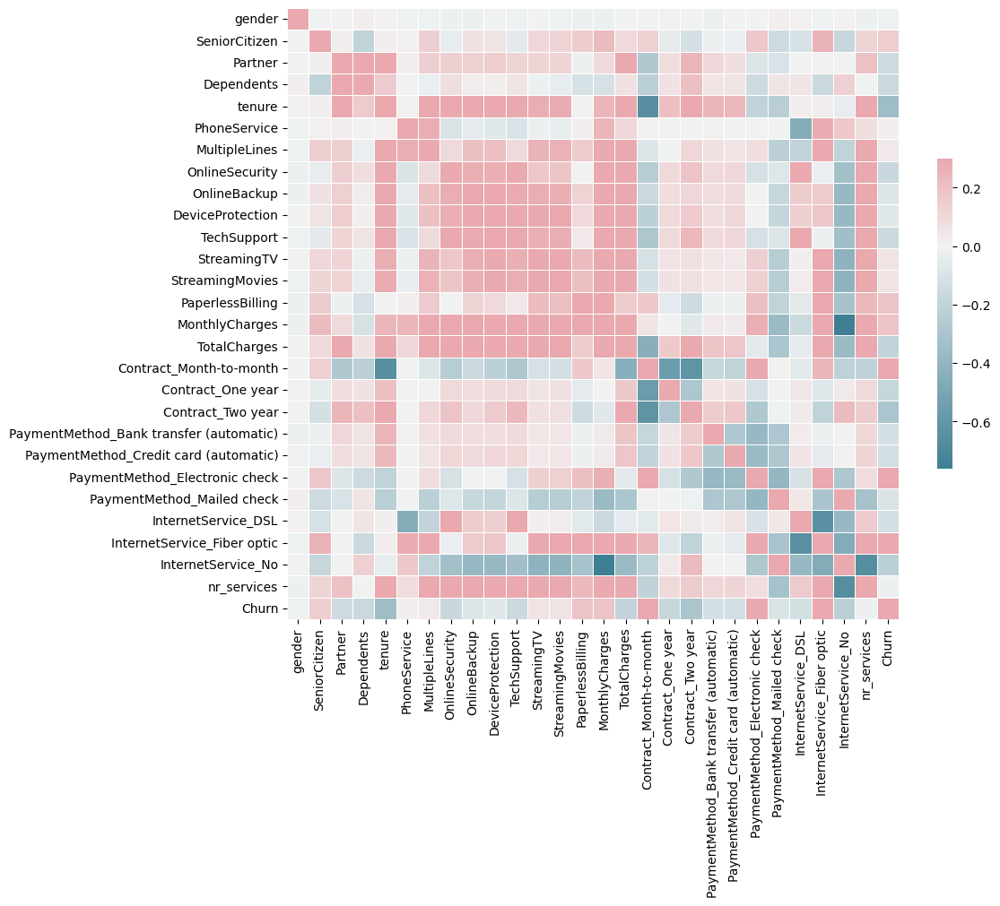

In [41]:
def plot_corr(df):
    corr = df.corr()
    f, ax = plt.subplots(figsize=(11, 9))
    cmap = sns.diverging_palette(220, 10, as_cmap=True)
    sns.heatmap(corr, cmap=cmap, vmax=.3, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})

plot_corr(df)

In [64]:
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,PaperlessBilling,MonthlyCharges,TotalCharges,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,InternetService_DSL,InternetService_Fiber optic,InternetService_No,nr_services,Cluster
0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,29.85,29.85,1,0,0,0,0,1,0,1,0,0,2,3
1,1,0,0,0,34,1,0,1,0,1,0,0,0,0,56.95,1889.50,0,1,0,0,0,0,1,1,0,0,4,2
2,1,0,0,0,2,1,0,1,1,0,0,0,0,1,53.85,108.15,1,0,0,0,0,0,1,1,0,0,4,3
3,1,0,0,0,45,0,0,1,0,1,1,0,0,0,42.30,1840.75,0,1,0,1,0,0,0,1,0,0,4,2
4,0,0,0,0,2,1,0,0,0,0,0,0,0,1,70.70,151.65,1,0,0,0,0,1,0,0,1,0,2,4


In [ ]:
#Creating numerical columns
num_cols=['tenure','MonthlyCharges','TotalCharges','nr_services']

#Creating categorical variables 
cat_cols= ['gender','SeniorCitizen','Partner', 'Dependents','PhoneService', 'MultipleLines','OnlineSecurity','OnlineBackup','DeviceProtection',
           'TechSupport','StreamingTV', 'StreamingMovies', 'PaperlessBilling','Contract_Month-to-month', 'Contract_One year', 'Contract_Two year','PaymentMethod_Bank transfer (automatic)','PaymentMethod_Credit card (automatic)'
           , 'PaymentMethod_Electronic check','PaymentMethod_Mailed check','InternetService_DSL','InternetService_Fiber optic','InternetService_No']

In [63]:
#creating histograms
df[num_cols].hist(figsize=(14,14))
plt.show()

NameError: name 'num_cols' is not defined

## <a name="clustering">4. Clustering</a> 
[Back to Table of Contents](#table)

In [45]:
df.drop(['Churn'],axis=1,inplace=True)


In [53]:
df_cluster = df
print(df_cluster.shape)


(7032, 27)


### <a name="kmeans">4.1. k-Means</a> 
[Back to Table of Contents](#table)

In [54]:
# 1. Standardize the Data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df_cluster)


In [55]:

# 2. Determine the Optimal Number of Clusters (Elbow Method)
inertia = []
K = range(1, 11)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data_scaled)
    inertia.append(kmeans.inertia_)


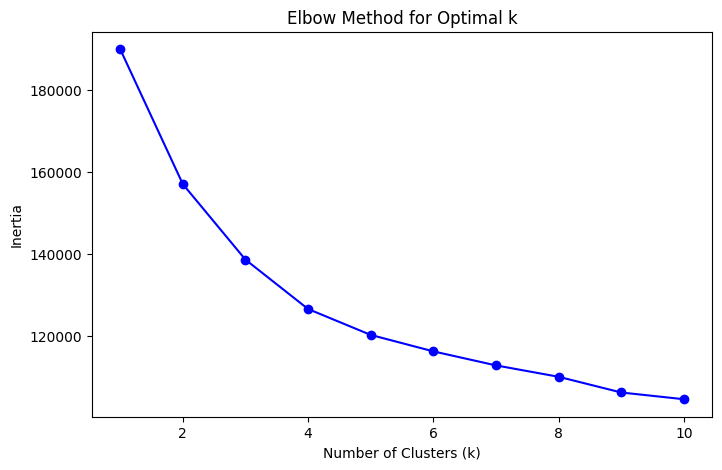

In [56]:

# Plot the Elbow Curve
plt.figure(figsize=(8, 5))
plt.plot(K, inertia, 'bo-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.show()


In [57]:

# 3. Apply K-Means Clustering
optimal_k = 6  # Choose the optimal number of clusters (e.g., based on the elbow method)
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
kmeans.fit(data_scaled)


KMeans(n_clusters=6, random_state=42)

In [59]:

# Add Cluster Labels to the DataFrame
df['Cluster'] = kmeans.labels_


In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7032 entries, 0 to 7042
Data columns (total 28 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   gender                                   7032 non-null   int64  
 1   SeniorCitizen                            7032 non-null   int64  
 2   Partner                                  7032 non-null   int32  
 3   Dependents                               7032 non-null   int32  
 4   tenure                                   7032 non-null   int64  
 5   PhoneService                             7032 non-null   int32  
 6   MultipleLines                            7032 non-null   int32  
 7   OnlineSecurity                           7032 non-null   int32  
 8   OnlineBackup                             7032 non-null   int32  
 9   DeviceProtection                         7032 non-null   int32  
 10  TechSupport                              7032 non-nul

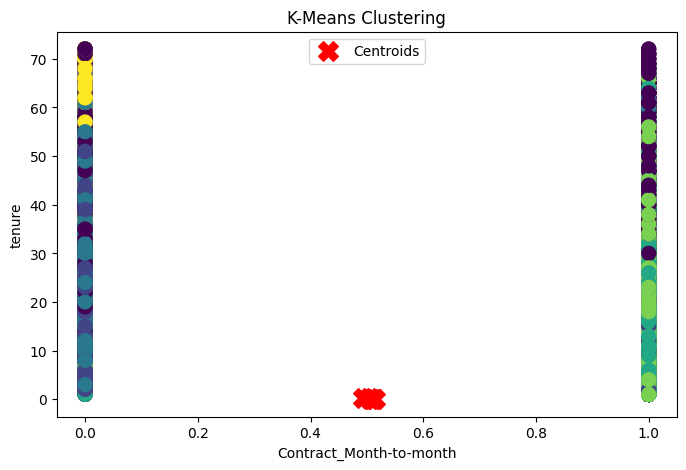

In [62]:

# 4. Visualize the Clusters
plt.figure(figsize=(8, 5))
plt.scatter(df['Contract_Month-to-month'], df['tenure'], c=df['Cluster'], cmap='viridis', s=100)
plt.scatter(kmeans.cluster_centers_[:, 0] * scaler.scale_[0] + scaler.mean_[0],
            kmeans.cluster_centers_[:, 1] * scaler.scale_[1] + scaler.mean_[1],
            color='red', marker='X', s=200, label='Centroids')
plt.xlabel('Contract_Month-to-month')
plt.ylabel('tenure')
plt.title('K-Means Clustering')
plt.legend()
plt.show()

In [35]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(df)

KMeans(n_clusters=4)

### <a name="normalizedkmeans">4.2. Normalized k-Means</a> 
[Back to Table of Contents](#table)

In [36]:
normalized_vectors = preprocessing.normalize(df)
scores = [KMeans(n_clusters=i+2).fit(normalized_vectors).inertia_ for i in range(10)]
sns.lineplot(np.arange(2, 12), scores)
plt.xlabel('Number of clusters')
plt.ylabel("Inertia")
plt.title("Inertia of Cosine k-Means versus number of clusters")

TypeError: lineplot() takes from 0 to 1 positional arguments but 2 were given

In [16]:
normalized_kmeans = KMeans(n_clusters=4)
normalized_kmeans.fit(normalized_vectors)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

### <a name="dbscan">4.3. DBSCAN</a> 
[Back to Table of Contents](#table)

In [18]:
min_samples = df.shape[1]+1 #  Rule of thumb; number of dimensions D in the data set, as minPts ≥ D + 1
dbscan = DBSCAN(eps=3.5, min_samples=min_samples).fit(df)

## <a name="visualization">5. Visualization</a> 
[Back to Table of Contents](#table)

### <a name="pca">5.1. PCA</a> 
[Back to Table of Contents](#table)

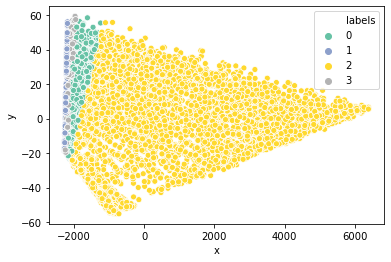

In [112]:
pca_df = prepare_pca(3, df, normalized_kmeans.labels_)
sns.scatterplot(x=pca_df.x, y=pca_df.y, hue=pca_df.labels, palette="Set2")

In [108]:
pca_df = prepare_pca(3, df, normalized_kmeans.labels_)
plot_3d(pca_df)

### <a name="tsne">5.2. t-SNE</a> 
[Back to Table of Contents](#table)

In [21]:
tsne_3d_df = prepare_tsne(3, df, kmeans.labels_)

In [22]:
plot_3d(tsne_3d_df)

In [307]:
tsne_3d_df['normalized_kmeans'] = normalized_kmeans.labels_
plot_3d(tsne_3d_df, name='normalized_kmeans')

In [67]:
min_samples = clustering.shape[1]+1 #  Rule of thumb; number of dimensions D in the data set, as minPts ≥ D + 1
dbscan = DBSCAN(eps=3.5, min_samples=min_samples).fit(clustering)
# dbscan = DBSCAN(eps=50, min_samples=min_samples).fit(clustering)
tsne_3d_df['dbscan'] = [str(label) for label in dbscan.labels_]
plot_3d(tsne_3d_df, name='dbscan')

### <a name="animation">5.3. 3D Animation</a> 
[Back to Table of Contents](#table)

MovieWriter imagemagick unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


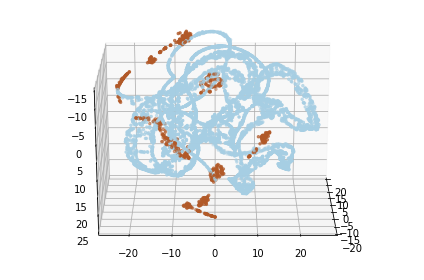

In [321]:
tsne_3d_df.dbscan = tsne_3d_df.dbscan.astype(int)
plot_animation(tsne_3d_df, 'normalized_kmeans', 'normalized_kmeans_new')

## <a name="evaluation">6. Evaluation</a> 
[Back to Table of Contents](#table)

In [7]:
kmeans = KMeans(n_clusters=4).fit(df)

normalized_vectors = preprocessing.normalize(df)
normalized_kmeans = KMeans(n_clusters=4).fit(normalized_vectors)

min_samples = df.shape[1]+1 #  Rule of thumb; number of dimensions D in the data set, as minPts ≥ D + 1
dbscan = DBSCAN(eps=3.5, min_samples=min_samples).fit(df)

In [105]:
print('kmeans: {}'.format(silhouette_score(df, kmeans.labels_, metric='euclidean')))
print('Cosine kmeans: {}'.format(silhouette_score(normalized_vectors, normalized_kmeans.labels_, metric='cosine')))
print('DBSCAN: {}'.format(silhouette_score(df, dbscan.labels_, metric='cosine')))

kmeans: 0.6018318118002677
Cosine kmeans: 0.8633823077551214
DBSCAN: 0.8302013261718773


## <a name="unique">7. What makes a cluster unique?</a> 
[Back to Table of Contents](#table)

One way to see the differences between clusters is to take the average value of each cluster and visualize it. 

In [9]:
# Setting all variables between 0 and 1 in order to better visualize the results
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df))
df_scaled.columns = df.columns
df_scaled['dbscan'] = dbscan.labels_

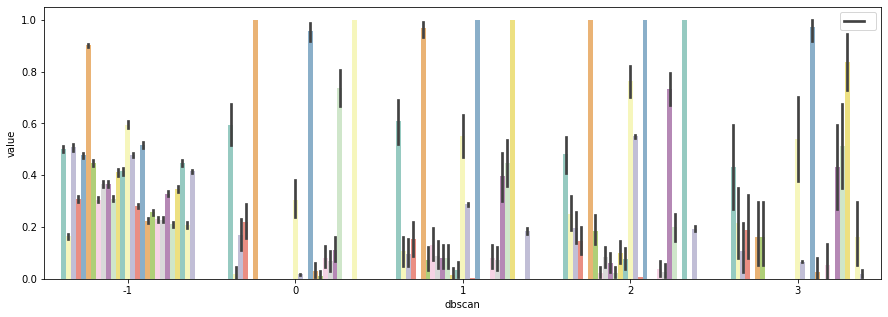

In [17]:
# df = load_preprocess_data()
df['dbscan'] = dbscan.labels_
tidy = df_scaled.melt(id_vars='dbscan')
fig, ax = plt.subplots(figsize=(15, 5))
sns.barplot(x='dbscan', y='value', hue='variable', data=tidy, palette='Set3')
plt.legend([''])
# plt.savefig("mess.jpg", dpi=300)
plt.savefig("dbscan_mess.jpg", dpi=300)

The problem with this approach is that we simply have too many variables. Not all of them are likely to be important when creating the clusters. Instead, I will select the most important columns based on the following approach: 

### <a name="variance">7.1. Variance</a> 
[Back to Table of Contents](#table)

What I essentially do is group datapoints by cluster and take the average. Then, I calculate the standard deviation between
those values for each variable. Variables with a high standard deviation indicate that there are large differences between clusters and that the variable might be important. 

In [11]:
df_mean = df_scaled.loc[df_scaled.dbscan!=-1, :].groupby('dbscan').mean().reset_index()

In [12]:
df_mean

,dbscan,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,...,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,InternetService_DSL,InternetService_Fiber optic,InternetService_No,nr_services
0,0,0.593750,0.018750,0.168750,0.218750,0.0,1.000000,0.000000,0.000000,0.000000,...,0.031250,0.0125,0.081250,0.068750,0.112500,0.737500,0.000000,0.0,1.000000,0.000000
1,1,0.609756,0.105691,0.097561,0.154472,0.0,0.967480,0.073171,0.130081,0.089431,...,0.000000,0.0000,0.081301,0.073171,0.398374,0.447154,1.000000,0.0,0.000000,0.183943
2,2,0.480447,0.251397,0.195531,0.145251,0.0,1.000000,0.184358,0.022346,0.083799,...,0.000000,0.0000,0.039106,0.027933,0.731844,0.201117,0.000000,1.0,0.000000,0.194134
3,3,0.432432,0.216216,0.108108,0.189189,0.0,0.162162,0.162162,0.000000,0.000000,...,0.027027,0.0000,0.054054,0.000000,0.432432,0.513514,0.837838,0.0,0.162162,0.020270


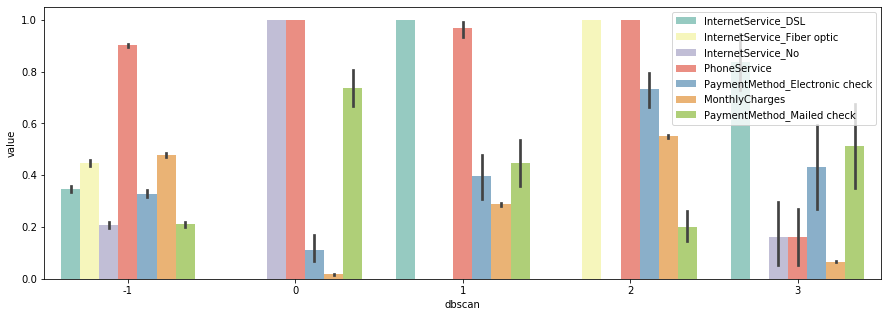

In [15]:
# Setting all variables between 0 and 1 in order to better visualize the results
# df = load_preprocess_data().drop("Churn", 1)
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df))
df_scaled.columns = df.columns
df_scaled['dbscan'] = dbscan.labels_

# Calculate variables with largest differences (by standard deviation)
# The higher the standard deviation in a variable based on average values for each cluster
# The more likely that the variable is important when creating the cluster
df_mean = df_scaled.loc[df_scaled.dbscan!=-1, :].groupby('dbscan').mean().reset_index()
results = pd.DataFrame(columns=['Variable', 'Std'])
for column in df_mean.columns[1:]:
    results.loc[len(results), :] = [column, np.std(df_mean[column])]
selected_columns = list(results.sort_values('Std', ascending=False).head(7).Variable.values) + ['dbscan']

# Plot data
tidy = df_scaled[selected_columns].melt(id_vars='dbscan')
fig, ax = plt.subplots(figsize=(15, 5))
sns.barplot(x='dbscan', y='value', hue='variable', data=tidy, palette='Set3')
plt.legend(loc='upper right')
plt.savefig("dbscan_results.jpg", dpi=300)

### <a name="feature">7.2. Feature Importance</a> 
[Back to Table of Contents](#table)

In [18]:
from sklearn.ensemble import RandomForestClassifier
y = df.iloc[:,-1]
X = df.iloc[:,:-1]
clf = RandomForestClassifier(n_estimators=100).fit(X, y)
selected_columns = list(pd.DataFrame(np.array([clf.feature_importances_, X.columns]).T, columns=['Importance', 'Feature'])
           .sort_values("Importance", ascending=False)
           .head(7)
           .Feature
           .values)

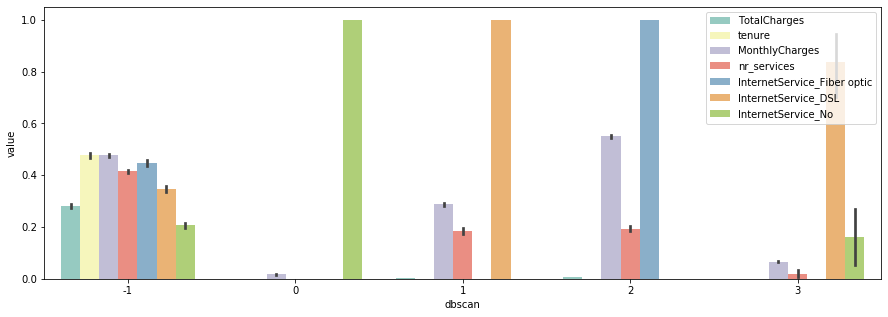

In [20]:
# Plot data
tidy = df_scaled[selected_columns+['dbscan']].melt(id_vars='dbscan')
fig, ax = plt.subplots(figsize=(15, 5))
sns.barplot(x='dbscan', y='value', hue='variable', data=tidy, palette='Set3')
plt.legend(loc='upper right')
plt.savefig('randomforest.jpg', dpi=300)